# Task 1 - Distribution of genes among the different clusters
This notebook analyses the distribution of individual genes among the different clusters.

This notebook is based on the single-cell tutorial (https://github.com/theislab/single-cell-tutorial). For further explanations of the applied methods please refer to above source.

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import os
from os import listdir
from os.path import isfile, join
import logging

In [2]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3

### Load adata

In [3]:
adata = sc.read_h5ad('../data/adata/processed_adata3.h5ad')
adata.obs

,sample_id,sample_nr,donor,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,log_counts,n_counts,n_genes,size_factors
AAACCCAAGCTGCCTG-1-1,16992-2D,1,mouse,3113,8.043663,9743.0,9.184407,34.014164,42.297034,51.021246,64.087037,1352.0,7.210080,13.876629,9.184304,9743.0,3113,2.360472
AAACCCAAGGTCATAA-1-1,16992-2D,1,mouse,2564,7.849714,7168.0,8.877522,27.734375,38.085938,48.660714,63.825335,507.0,6.230482,7.073103,8.877382,7168.0,2564,1.786558
AAACCCAAGTACCCTA-1-1,16992-2D,1,mouse,2819,7.944492,8436.0,9.040382,27.750119,38.205311,47.878141,62.849692,630.0,6.447306,7.467994,9.040263,8436.0,2819,2.110656
AAACCCACAAGGTCTT-1-1,16992-2D,1,mouse,1932,7.566828,4536.0,8.420021,26.410935,36.331570,47.266314,64.285714,277.0,5.627621,6.106702,8.419801,4536.0,1932,1.236708
AAACCCACAGGAGGTT-1-1,16992-2D,1,mouse,2930,7.983099,8959.0,9.100526,29.679652,38.910593,48.018752,62.808349,604.0,6.405229,6.741824,9.100414,8959.0,2930,2.218654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCTAGGTT-1-1,16992-2D,1,mouse,2192,7.693026,5087.0,8.534640,25.122862,34.499705,44.584234,60.723413,301.0,5.710427,5.917044,8.534444,5087.0,2192,1.391775
TTTGTTGGTGGACTGA-1-1,16992-2D,1,mouse,2301,7.741534,4901.0,8.497398,22.444399,31.034483,41.154866,57.702510,258.0,5.556828,5.264232,8.497194,4901.0,2301,1.438646
TTTGTTGTCACAAGAA-1-1,16992-2D,1,mouse,1168,7.063904,2138.0,7.668094,31.571562,39.569691,49.906455,68.755847,173.0,5.159055,8.091675,7.667626,2138.0,1168,0.485150
TTTGTTGTCCTACGGG-1-1,16992-2D,1,mouse,1908,7.554335,4492.0,8.410275,31.923419,41.874443,51.246661,66.651825,348.0,5.855072,7.747106,8.410053,4492.0,1908,1.118800


<a id="Clustering"></a>

## Clustering

In [4]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.3, key_added='louvain_r0.5', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:01)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical) (0:00:01)


In [5]:
adata.obs['louvain_r0.5'].value_counts()

0    4585
1    3684
2     519
3     206
4     196
Name: louvain_r0.5, dtype: int64

In [6]:
adata.obs['louvain_r1'].value_counts()

0     1933
1     1339
2     1332
3      906
4      811
5      745
6      668
7      521
8      315
9      219
10     201
11     200
Name: louvain_r1, dtype: int64

After discussion with our team, we decided to continue with louvain_r0.5, which has a resolution of 0.3

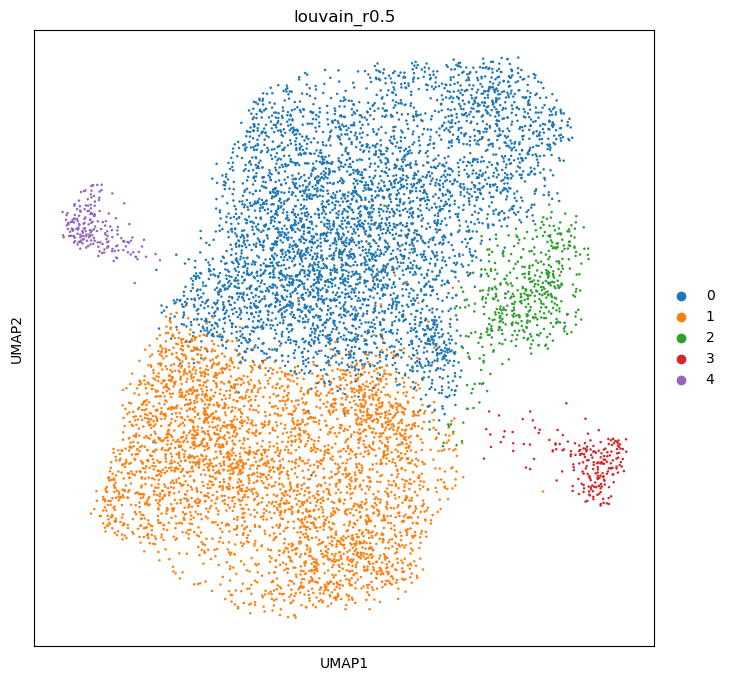

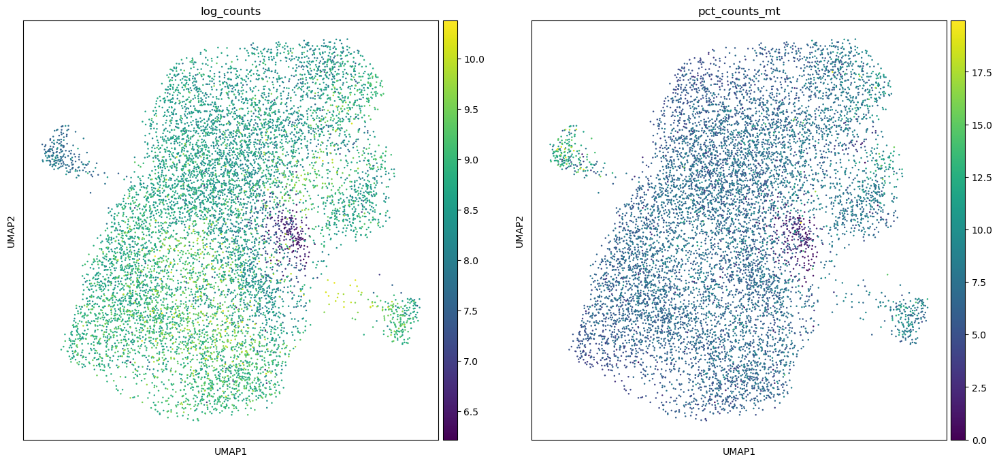

In [7]:
# Analysis sees 3 classes here
# Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['louvain_r0.5'], save='/16992-2D/UMAP.pdf')
os.rename("figures/umap/16992-2D/UMAP.pdf", 
          "../results/task1/16992-2D/UMAP.pdf")

sc.pl.umap(adata, color=['log_counts', 'pct_counts_mt'], save='/16992-2D/UMAP_counts.pdf')
os.rename("figures/umap/16992-2D/UMAP_counts.pdf", 
          "../results/task1/16992-2D/UMAP_counts.pdf")

<a id="Markers"></a>

## Marker genes & cluster annotation

In [8]:
# Calculate marker genes
adata.uns['log1p']["base"] = None
sc.tl.rank_genes_groups(adata, groupby='louvain_r0.5', key_added='rank_genes_r0.5')

ranking genes
    finished: added to `.uns['rank_genes_r0.5']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


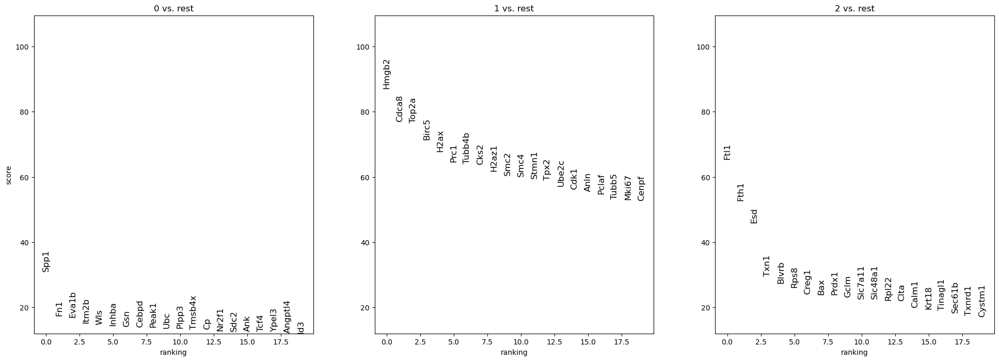

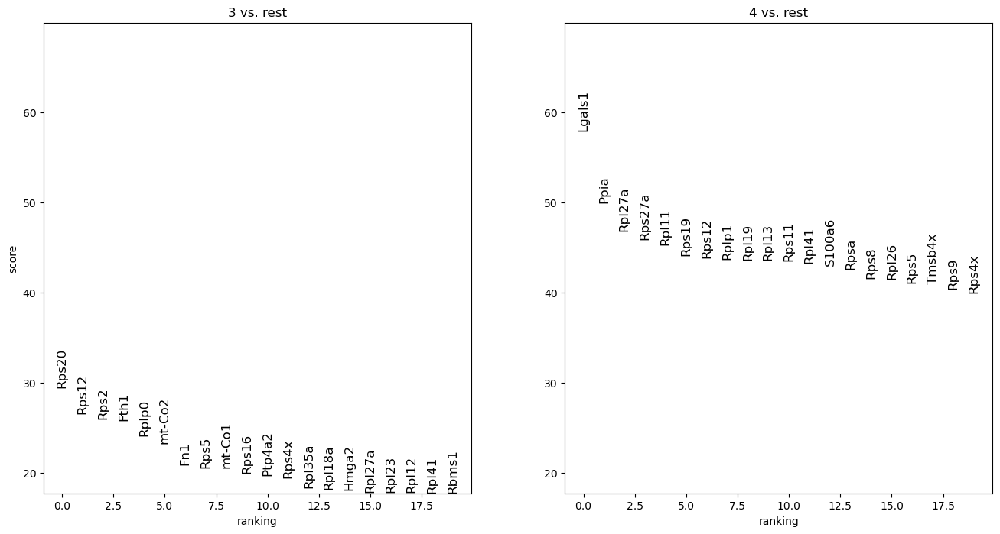

In [9]:
# Plot marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=['0','1','2'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=['3', '4'], fontsize=12)

In [10]:
# Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

Below we plot genes of particular interest within the clusters

### Cluster 0

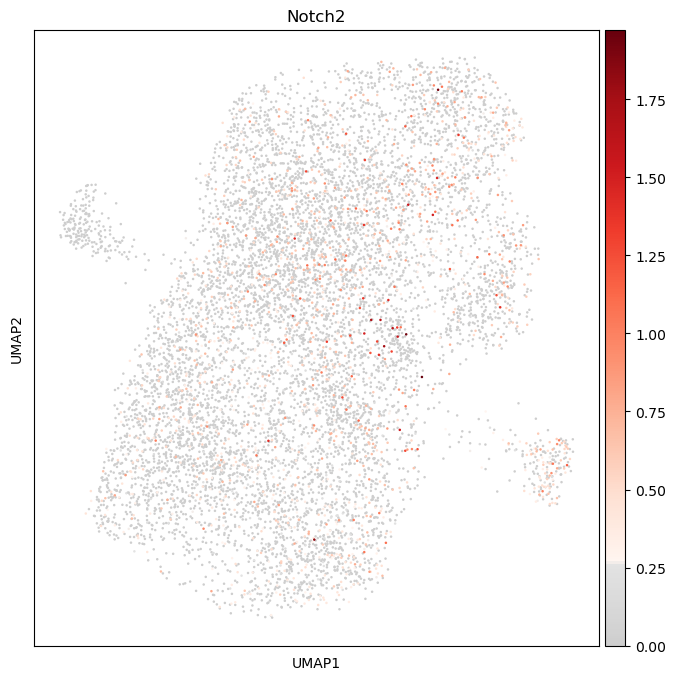

In [11]:
# Notch2
sc.pl.umap(adata, color='Notch2', use_raw=False, color_map=mymap, save='/16992-2D/Cluster0/Notch2.pdf')
os.rename("figures/umap/16992-2D/Cluster0/Notch2.pdf", 
          "../results/task1/16992-2D/Cluster0/Notch2.pdf")

### Cluster 1

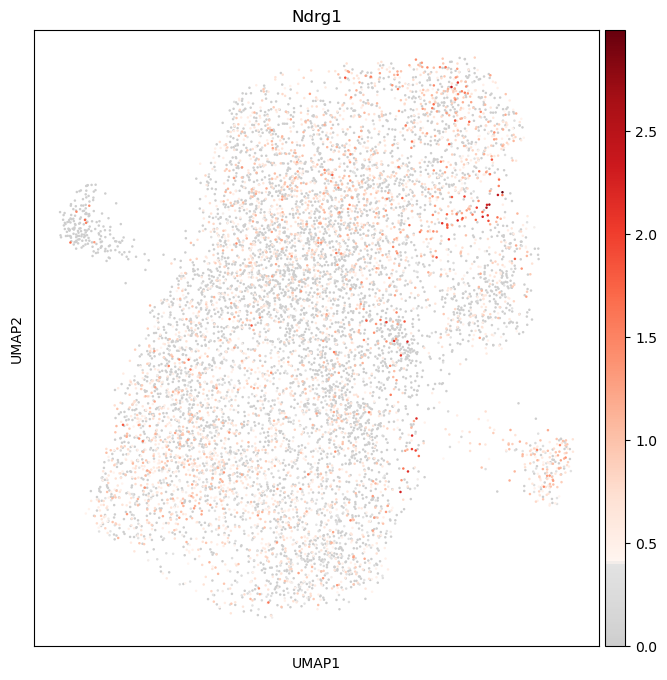

In [12]:
# Ndrg1
sc.pl.umap(adata, color='Ndrg1', use_raw=False, color_map=mymap, save='/16992-2D/Cluster1/Ndrg1.pdf')
os.rename("figures/umap/16992-2D/Cluster1/Ndrg1.pdf", 
          "../results/task1/16992-2D/Cluster1/Ndrg1.pdf")

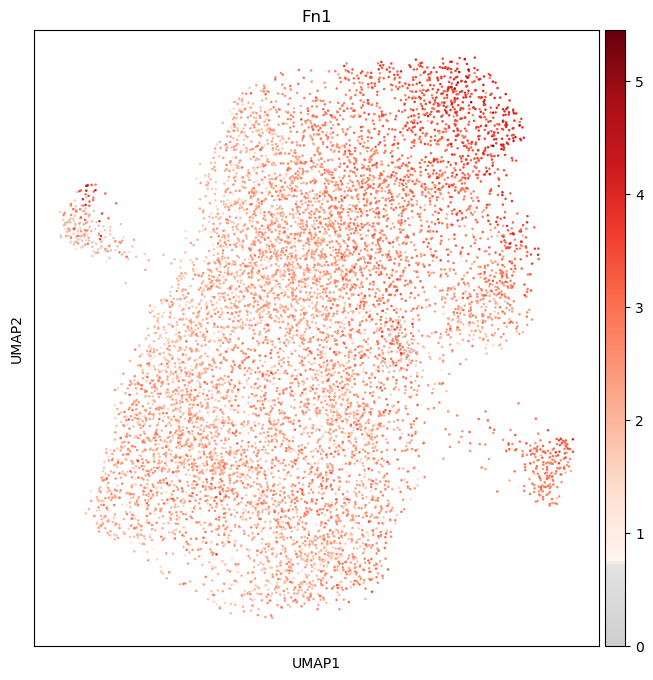

In [13]:
# Fn1
sc.pl.umap(adata, color='Fn1', use_raw=False, color_map=mymap, save='/16992-2D/Cluster1/Fn1.pdf')
os.rename("figures/umap/16992-2D/Cluster1/Fn1.pdf", 
          "../results/task1/16992-2D/Cluster1/Fn1.pdf")

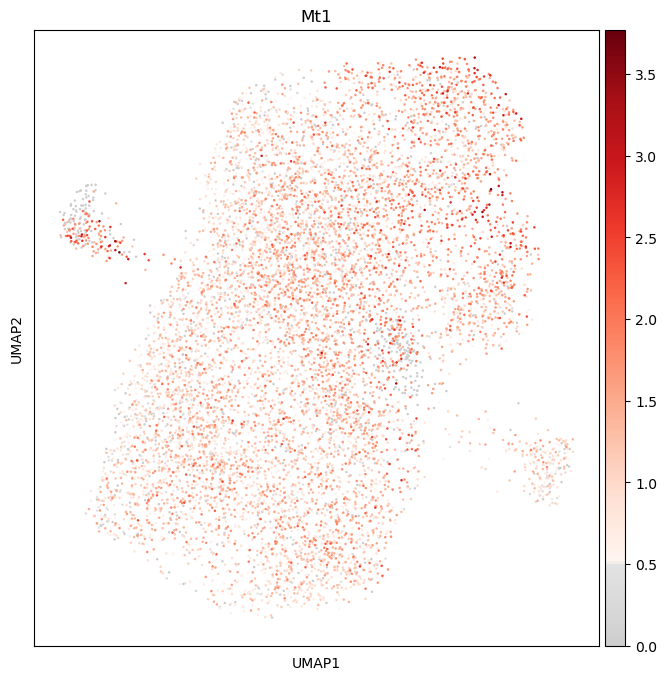

In [14]:
# Mt1
sc.pl.umap(adata, color='Mt1', use_raw=False, color_map=mymap, save='/16992-2D/Cluster1/Mt1.pdf')
os.rename("figures/umap/16992-2D/Cluster1/Mt1.pdf", 
          "../results/task1/16992-2D/Cluster1/Mt1.pdf")

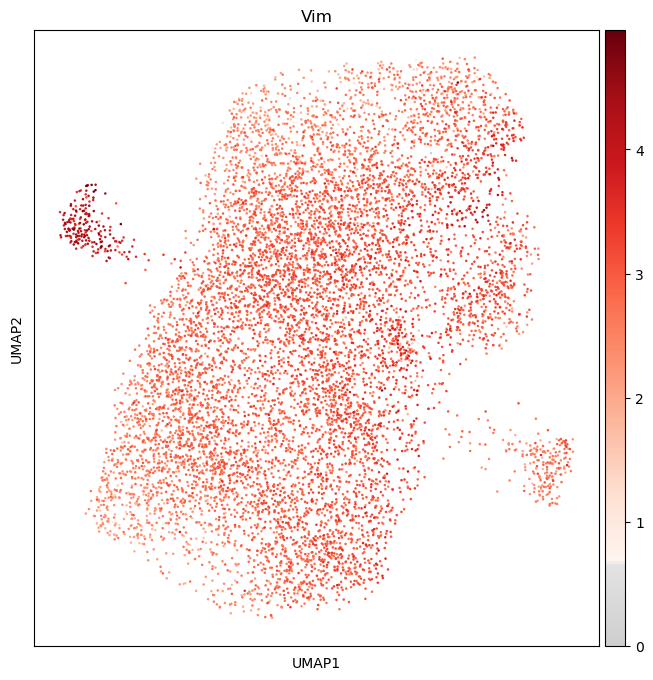

In [15]:
# Vim
sc.pl.umap(adata, color='Vim', use_raw=False, color_map=mymap, save='/16992-2D/Cluster1/Vim.pdf')
os.rename("figures/umap/16992-2D/Cluster1/Vim.pdf", 
          "../results/task1/16992-2D/Cluster1/Vim.pdf")

### Cluster 2

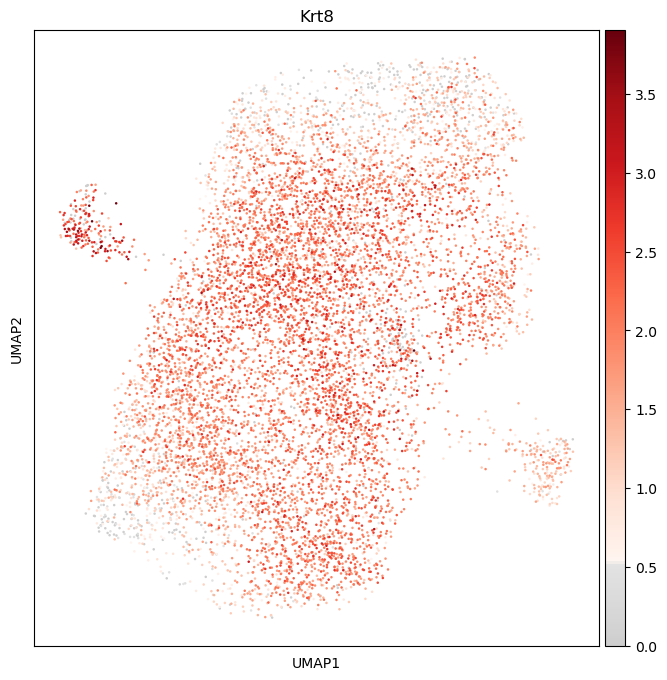

In [16]:
# Krt8
sc.pl.umap(adata, color='Krt8', use_raw=False, color_map=mymap, save='/16992-2D/Cluster2/Krt8.pdf')
os.rename("figures/umap/16992-2D/Cluster2/Krt8.pdf", 
          "../results/task1/16992-2D/Cluster2/Krt8.pdf")

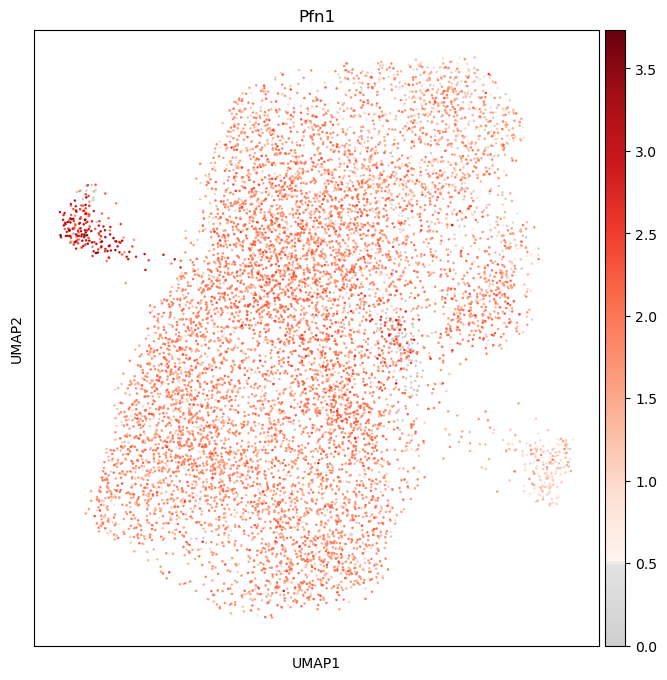

In [17]:
# Pfn1
sc.pl.umap(adata, color='Pfn1', use_raw=False, color_map=mymap, save='/16992-2D/Cluster2/Pfn1.pdf')
os.rename("figures/umap/16992-2D/Cluster2/Pfn1.pdf", 
          "../results/task1/16992-2D/Cluster2/Pfn1.pdf")

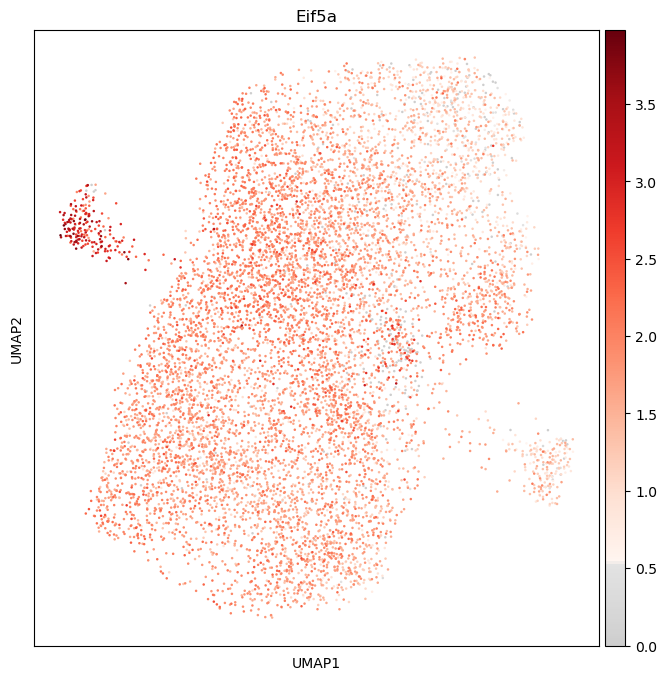

In [18]:
# Eif5a
sc.pl.umap(adata, color='Eif5a', use_raw=False, color_map=mymap, save='/16992-2D/Cluster2/Eif5a.pdf')
os.rename("figures/umap/16992-2D/Cluster2/Eif5a.pdf", 
          "../results/task1/16992-2D/Cluster2/Eif5a.pdf")

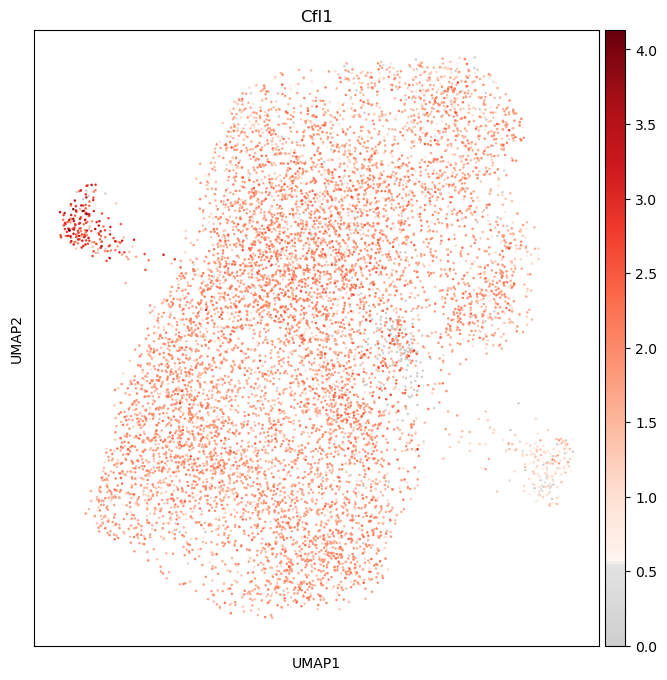

In [19]:
# Cfl1
sc.pl.umap(adata, color='Cfl1', use_raw=False, color_map=mymap, save='/16992-2D/Cluster2/Cfl1.pdf')
os.rename("figures/umap/16992-2D/Cluster2/Cfl1.pdf", 
          "../results/task1/16992-2D/Cluster2/Cfl1.pdf")

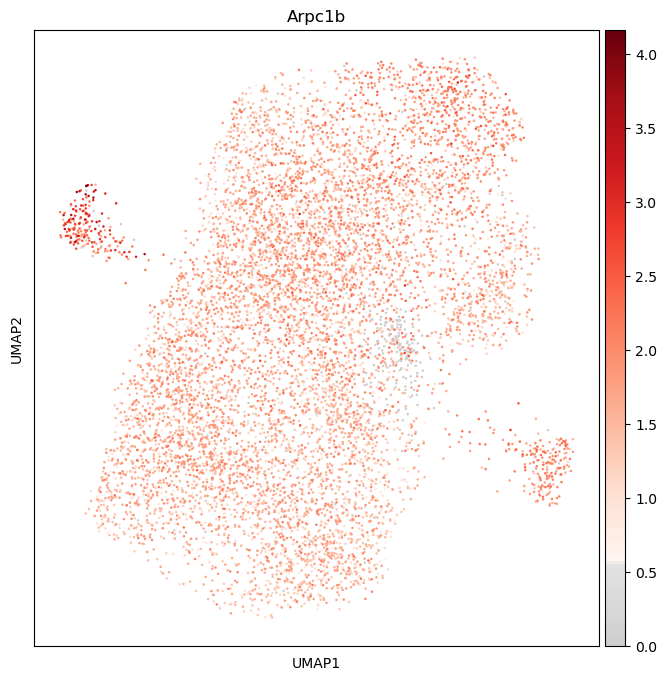

In [20]:
# Arpc1b
sc.pl.umap(adata, color='Arpc1b', use_raw=False, color_map=mymap, save='/16992-2D/Cluster2/Arpc1b.pdf')
os.rename("figures/umap/16992-2D/Cluster2/Arpc1b.pdf", 
          "../results/task1/16992-2D/Cluster2/Arpc1b.pdf")

### Cluster 3

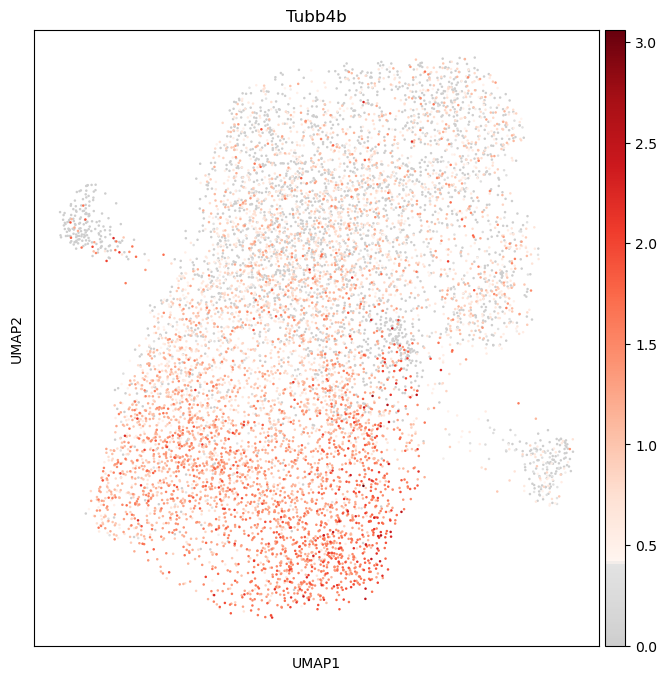

In [21]:
# Tubb4b
sc.pl.umap(adata, color='Tubb4b', use_raw=False, color_map=mymap, save='/16992-2D/Cluster3/Tubb4b.pdf')
os.rename("figures/umap/16992-2D/Cluster3/Tubb4b.pdf", 
          "../results/task1/16992-2D/Cluster3/Tubb4b.pdf")

### Cluster 4

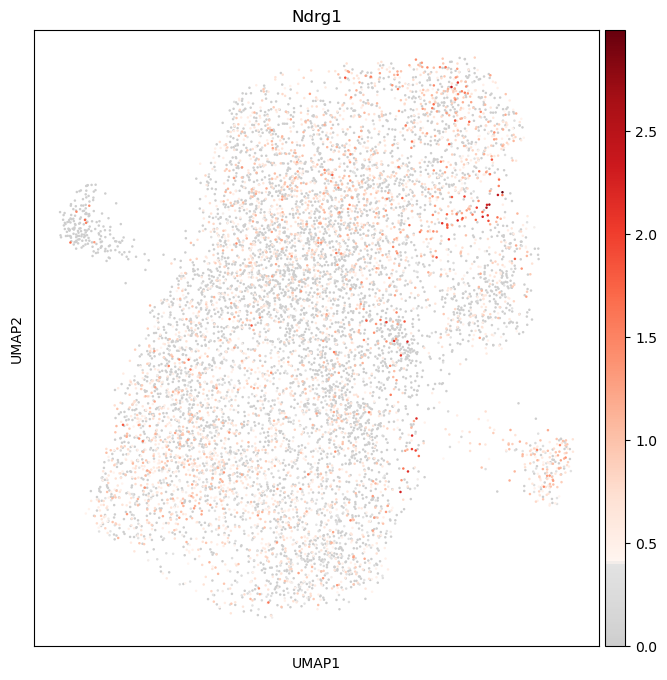

In [22]:
# Ndrg1
sc.pl.umap(adata, color='Ndrg1', use_raw=False, color_map=mymap, save='/16992-2D/Cluster4/Ndrg1.pdf')
os.rename("figures/umap/16992-2D/Cluster4/Ndrg1.pdf", 
          "../results/task1/16992-2D/Cluster4/Ndrg1.pdf")

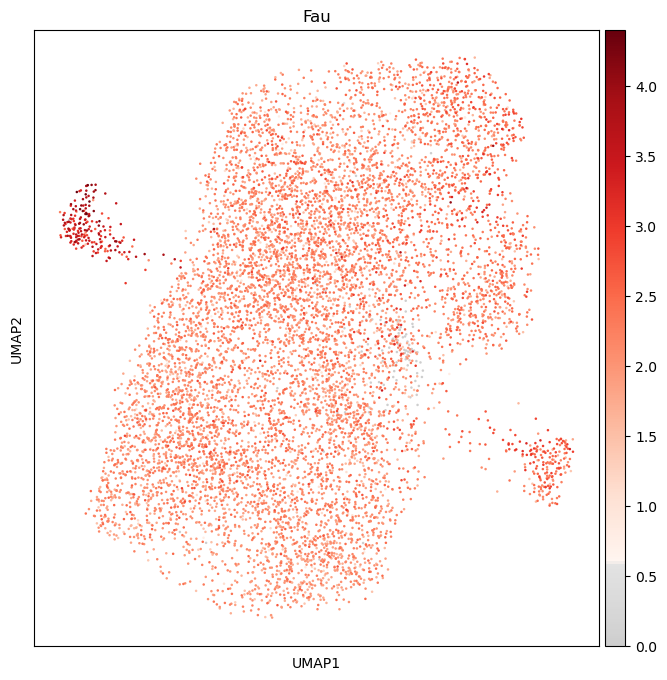

In [23]:
# Fau
sc.pl.umap(adata, color='Fau', use_raw=False, color_map=mymap, save='/16992-2D/Cluster4/Fau.pdf')
os.rename("figures/umap/16992-2D/Cluster4/Fau.pdf", 
          "../results/task1/16992-2D/Cluster4/Fau.pdf")

### New Set

16992:
Krt8
Ccn2
Cdca7
Tpm1
Npm1
Hmgb2
Cdac8
Birc5
Anln
Cdk1
Mik67
Fn1
Tpt1
Gsn
Wls
Npc2
Ank
Nrf2f1
Ctsd
Ypel3
Cst3
Ftl1
Blvrb
Txn1
Krt18
Fn1
Pmepa1
Timp3
Lgals1
Ppia
S100a6

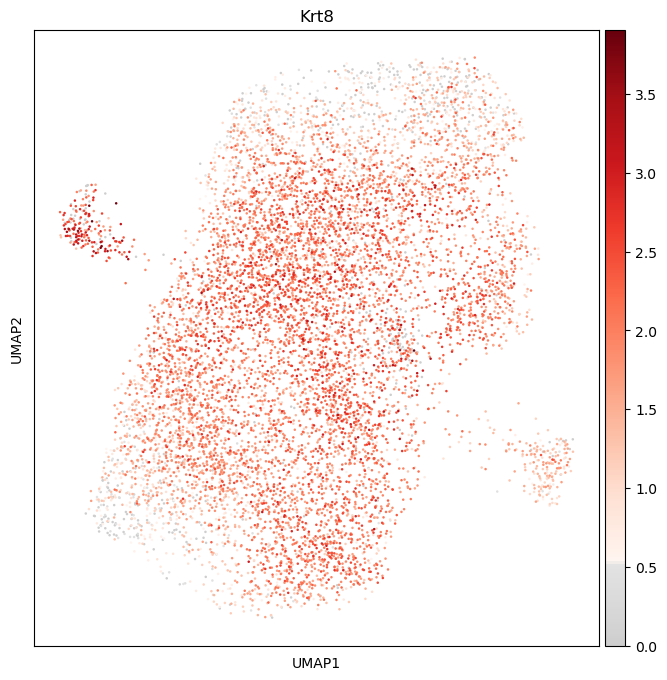

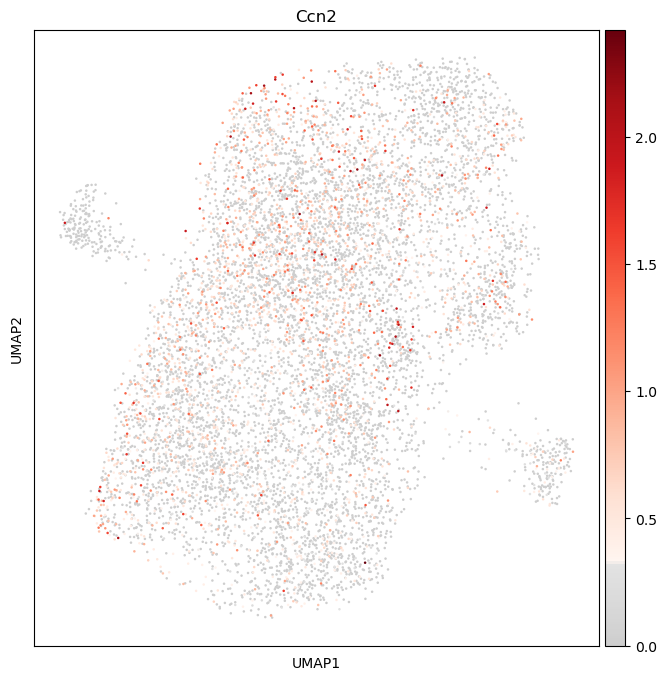

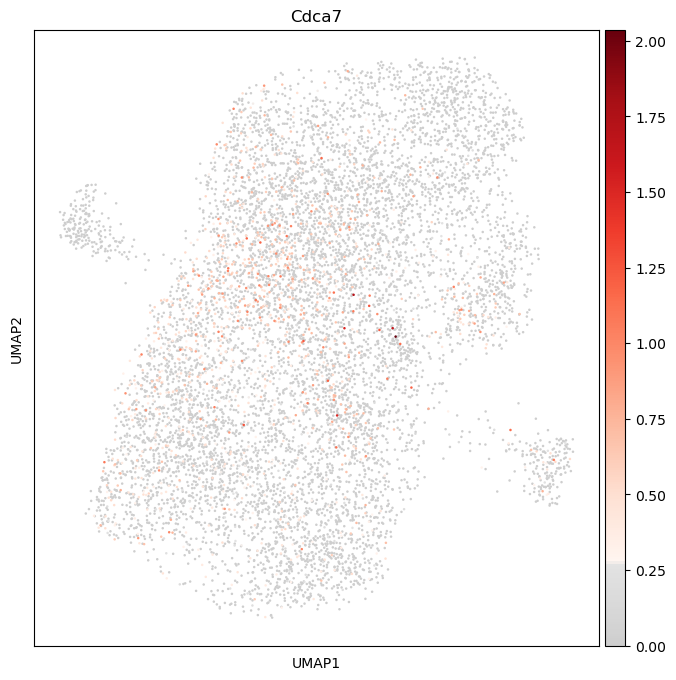

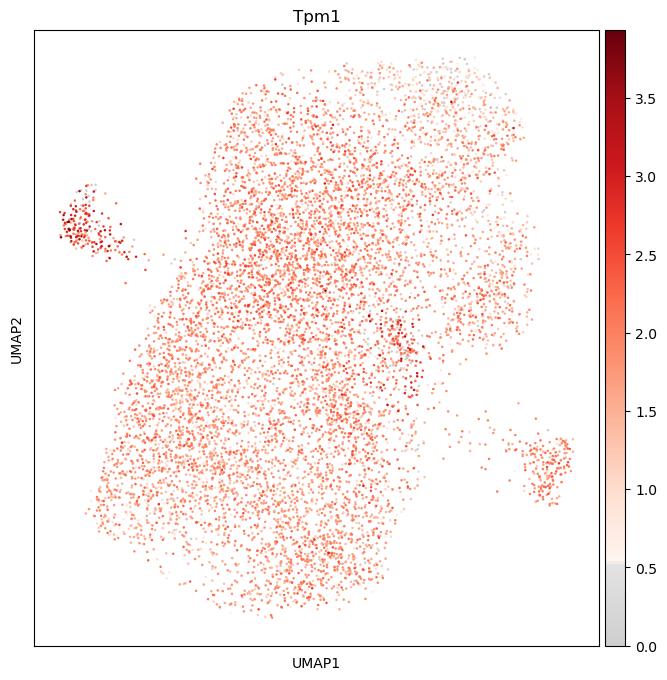

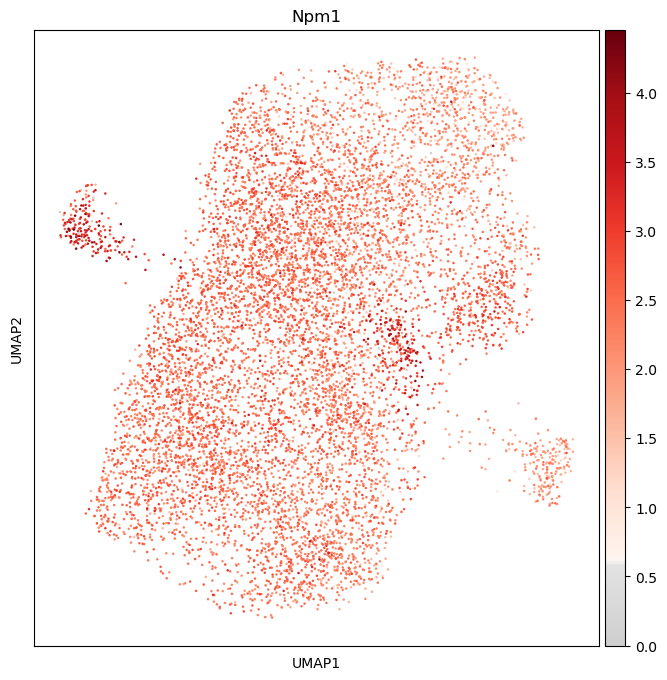

...

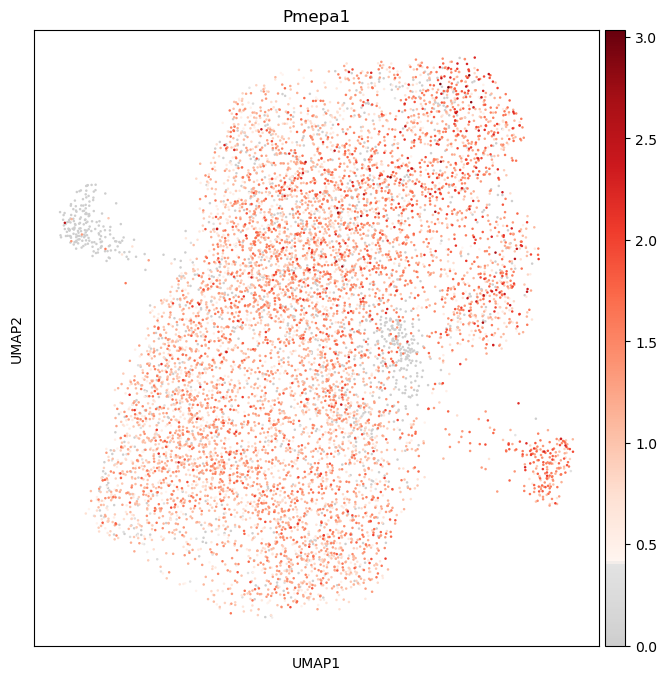

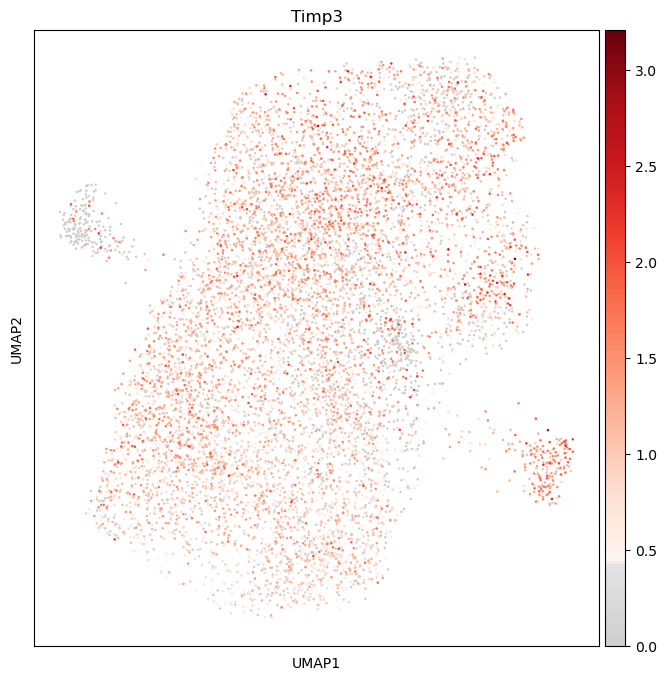

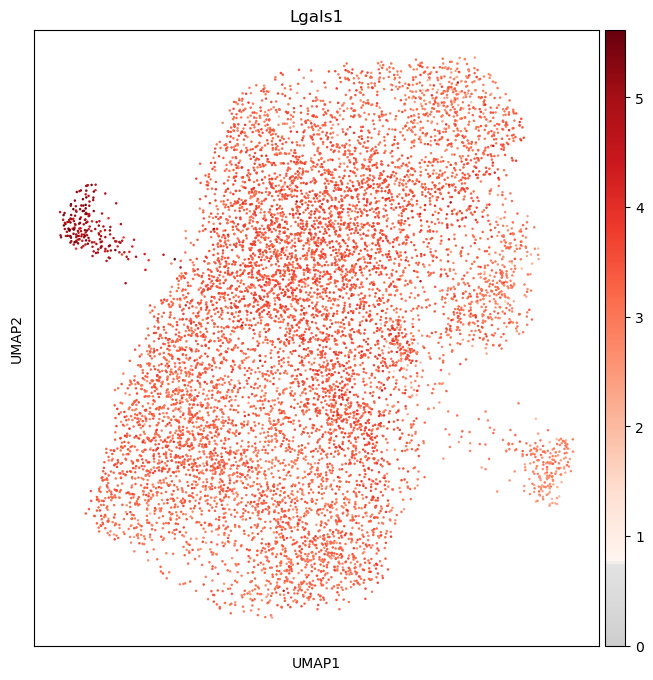

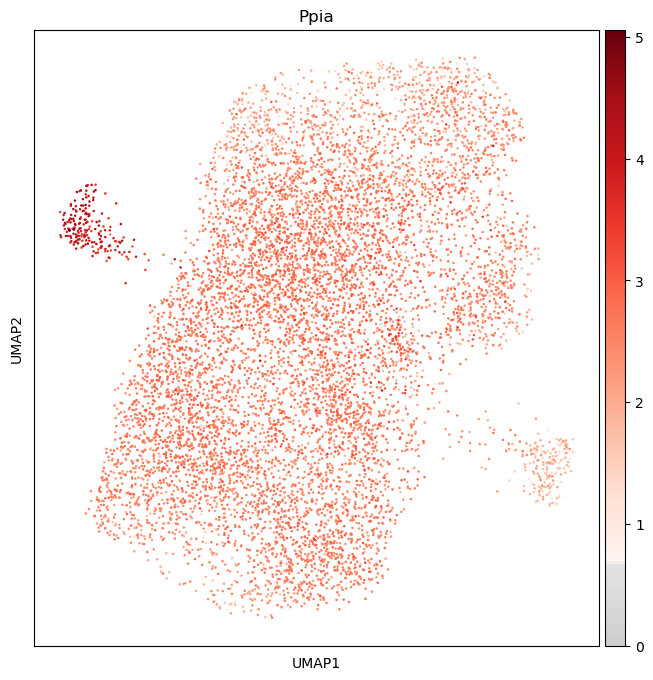

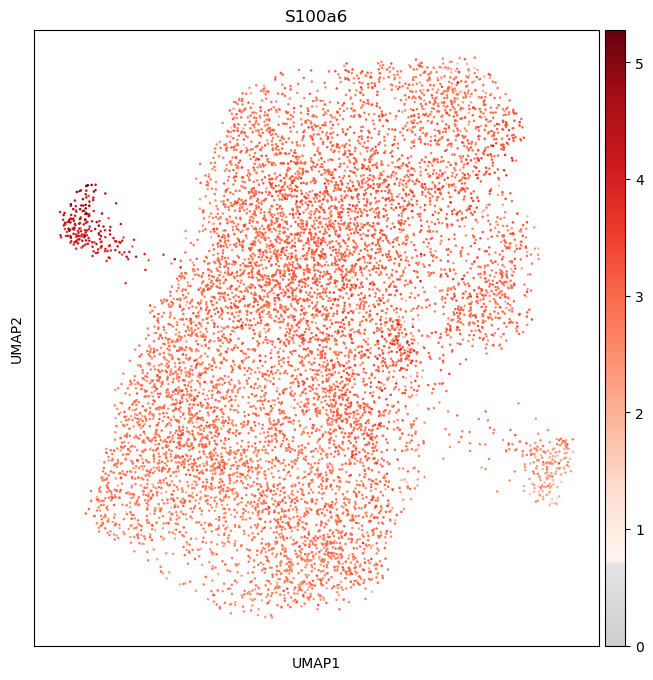

In [24]:
new_set = ['Krt8', 'Ccn2', 'Cdca7', 'Tpm1', 'Npm1', 'Hmgb2', 'Birc5', 'Anln', 'Cdk1', 'Mki67', 'Fn1', 'Tpt1', 'Gsn', 'Wls', 'Npc2', 'Ank', 'Ctsd', 'Ypel3', 'Cst3', 'Ftl1', 'Blvrb', 'Txn1', 'Krt18', 'Fn1', 'Pmepa1', 'Timp3', 'Lgals1', 'Ppia', 'S100a6']
# 'Cdac8' is not in 16992-2D
# 'Mik67' is not in 16992-2D
# 'Nrf2f1' is not in 16992-2D
for gene in new_set:
    sc.pl.umap(adata, color=gene, use_raw=False, color_map=mymap, save='/16992-2D/New_set/' + gene + '.pdf')
    os.rename("figures/umap/16992-2D/New_set/" + gene + ".pdf", 
          "../results/task1/16992-2D/New_set/" + gene + ".pdf")